# OpenSky flight trajectories

Flight path information for commercial flights is available for some regions of the USA and Europe from the crowd-sourced [OpenSky Network](https://opensky-network.org/).  OpenSky collects data from a large number of users monitoring public air-traffic control information.  Here we will use a subset of the data that was polled from their REST API at an interval of 1 minute over 4 days (September 5-13, 2016), using the `collect_data.py` and `prepare_data.py` scripts.  In general the terms of use for OpenSky data do not allow redistribution, but we have obtained specific permission for distributing the subset of the data used in this project, which is a 200MB Parquet file (1.1GB as the original database). If you want more or different data, you can run the scripts yourself, or else you can contact OpenSky asking for a copy of the dataset.

We'll only use some of the fields provided by OpenSky, out of: *icao24, callsign, origin, time_position, time_velocity, longitude, latitude, altitude, on_ground, velocity, heading, vertical_rate, sensors, timestamp*

Here, we'll load the data and declare that some fields are categorical (which isn't information fully expressed in the Parquet file):

In [1]:
%%time
import pandas as pd

flightpaths = pd.read_parquet('./data/opensky.parq')
flightpaths['origin']    = flightpaths.origin.astype('category')
flightpaths['ascending'] = flightpaths.ascending.astype('category')
flightpaths.tail()

CPU times: user 355 ms, sys: 139 ms, total: 494 ms
Wall time: 494 ms


,longitude,latitude,origin,ascending,velocity
10227905,-8.845280e+06,4.553381e+06,,True,262.14
10227906,-8.862735e+06,4.540946e+06,,False,183.28
10227907,-8.876594e+06,4.530873e+06,,False,258.15
10227908,-8.894316e+06,4.521176e+06,,True,234.24
10227909,NaN,NaN,,False,0.00


The default database has about 10 million points, with some metadata for each.  

Now let's define a datashader-based processing pipeline to render images:

In [2]:
import datashader as ds
from colorcet import fire

plot_width  = 850
plot_height = 600
x_range = (-2.0e6, 2.5e6)
y_range = (4.1e6, 7.8e6)

/home/runner/work/examples/examples/opensky/envs/default/lib/python3.11/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


We can use this function to get a dump of all of the trajectory information:

In [3]:
cvs = ds.Canvas(plot_width, plot_height, x_range, y_range)

In [4]:
%%time
agg = cvs.line(flightpaths, 'longitude', 'latitude',  ds.count())

CPU times: user 2.15 s, sys: 55.2 ms, total: 2.21 s
Wall time: 2.21 s


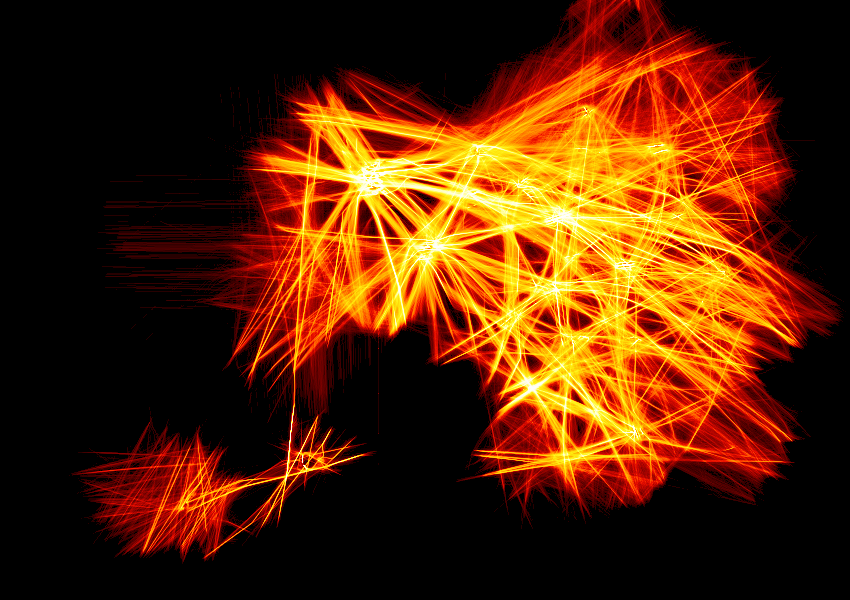

In [5]:
ds.tf.set_background(ds.tf.shade(agg, cmap=fire), 'black')

This plot shows all of the trajectories in this database, overlaid in a way that avoids [overplotting](https://datashader.org/user_guide/Plotting_Pitfalls.html).  With this "fire" color map, a single trajectory shows up as black, while increasing levels of overlap show up as brighter colors.  

A static image on its own like this is difficult to interpret, but if we overlay it on a map we can see where these flights originate, and can zoom in to see detail in specific regions:

In [6]:
import hvplot.pandas # noqa
from holoviews import opts

opts.defaults(
    opts.Path(width=plot_width, height=plot_height, xaxis=None, yaxis=None,
              xlim=x_range, ylim=y_range))

In [7]:
flightpaths.hvplot.paths(
    'longitude', 'latitude', tiles='EsriStreet',
     aggregator=ds.count(), datashade=True,
)

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [longitude,latitude]   (R,G,B,A)

E.g. try zooming in on London in the above figure, which has a lot of structure not visible in the initial rendering but visible on a zoom. Note that zooming in will only reveal more detail in the datashader plot if you are working with a live server; a static HTML view will dynamically update the underlying map plot, but not the data.  

We can use the metadata associated with each trajectory to show additional information.  For instance, we can color each flight by its country of origin, using the key:

* **UK** - Orange
* **Germany** - Blue
* **Netherland** - Teal
* **Switzerland** - Yellow
* **France** - Purple
* **Norway** - Green
* **USA** - Red

(There are actually more than a hundred different origins, so this key is only approximate.)

In [8]:
import numpy as np
from matplotlib.colors import rgb2hex
from matplotlib import colormaps

def categorical_color_key(aggregator, cmap):
    """
    Generate a color key from the given colormap with the appropriate number
    of colors for flightpaths.
    """
    ncats = len(flightpaths[aggregator.column].unique())
    return [str(rgb2hex(colormaps.get_cmap(cmap)(i))) for i in np.linspace(0, 1, ncats)]

In [9]:
aggregator = ds.by('origin')
flightpaths.hvplot.paths(
    'longitude', 'latitude', tiles='EsriStreet',
    datashade=True, aggregator=aggregator,
    color_key=categorical_color_key(aggregator, 'hsv_r'), legend=False,
)

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [longitude,latitude]   (R,G,B,A)

Or we can label ascending (Blue) vs. descending flights (Red), which is particularly informative when zooming in on specific airports:

In [10]:
flightpaths.hvplot.paths(
    'longitude', 'latitude', tiles='EsriStreet',
    datashade=True, aggregator=ds.by('ascending'),
    color_key=['red', 'blue'], legend=False,
)

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [longitude,latitude]   (R,G,B,A)

Or we can show velocity, which of course decreases (dark colors) when approaching or leaving airports:

In [11]:
flightpaths.hvplot.paths(
    'longitude', 'latitude', tiles='EsriStreet',
    datashade=True, aggregator=ds.mean('velocity'), cmap=fire[::-1],
)

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [longitude,latitude]   (R,G,B,A)

The flight patterns associated with each airport are clearly visible in these close-ups of various cities, where the circular holding pattern for landings (red) is clearly visible for the various airports in London:

In [12]:
hvplot.extension('matplotlib')

opts.defaults(
    opts.RGB(xaxis=None, yaxis=None, bgcolor='black', axiswise=True),
    opts.Layout(hspace=0.1, vspace=0, sublabel_format=None, framewise=True))

In [13]:
import holoviews as hv
from holoviews.util.transform import lon_lat_to_easting_northing as ll_en

cities = {'Frankfurt' : (8.6821, 50.1109),
          'London'    : (-0.1278, 51.5074), 
          'Paris'     : (2.3522, 48.8566),
          'Amsterdam' : (4.8952, 52.3702),
          'Zurich'    : (8.5417, 47.3769),
          'Munich'    : (11.5820, 48.1351)}

radius = 150000
mercator_cities = {city: ll_en(lon, lat) for city, (lon, lat) in cities.items()}
city_ranges = {city: dict(xlim=(lon-radius, lon+radius), ylim=(lat-radius, lat+radius))
               for city, (lon, lat) in mercator_cities.items()}

:Layout
   .RGB.I   :RGB   [longitude,latitude]   (R,G,B,A)
   .RGB.II  :RGB   [longitude,latitude]   (R,G,B,A)
   .RGB.III :RGB   [longitude,latitude]   (R,G,B,A)
   .RGB.IV  :RGB   [longitude,latitude]   (R,G,B,A)
   .RGB.V   :RGB   [longitude,latitude]   (R,G,B,A)
   .RGB.VI  :RGB   [longitude,latitude]   (R,G,B,A)
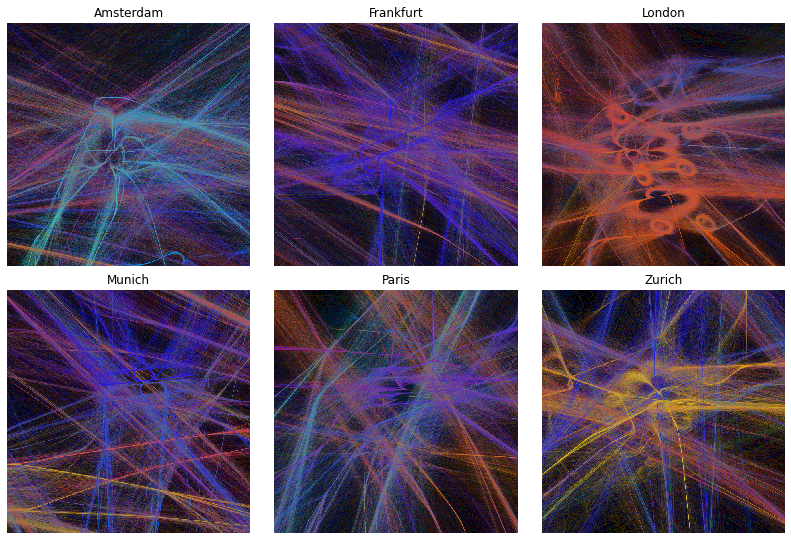

In [14]:
paths_plot = [
    flightpaths.hvplot.paths(
        'longitude', 'latitude', dynamic=False,
        datashade=True, aggregator=aggregator,
        color_key=categorical_color_key(aggregator, 'hsv_r'),
        legend=False, title=city, data_aspect=1, **ranges
    )
    for city, ranges in sorted(city_ranges.items())
]
hv.Layout(paths_plot).cols(3)

The patterns for a single city can make a nice wallpaper for your desktop if you wish:

:DynamicMap   []
   :RGB   [longitude,latitude]   (R,G,B,A)
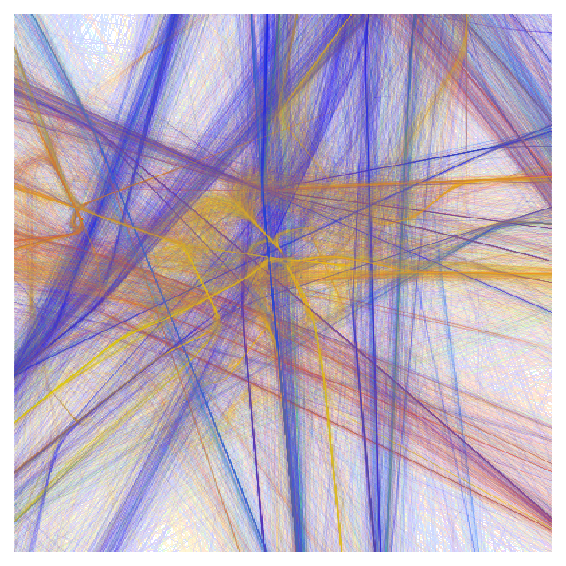

In [15]:
flightpaths.hvplot.paths(
    'longitude', 'latitude',
    datashade=True, aggregator=aggregator,
    color_key=categorical_color_key(aggregator, 'hsv_r'),
    bgcolor=None, width=400, data_aspect=1, legend=False,
    **city_ranges["Zurich"]
)

As you can see, datashader makes it quite easy to explore even large databases of trajectory information, without trial and error parameter setting and experimentation.  These examples have millions of datapoints, but it could work with billions just as easily, covering long time ranges or large geographic areas.

This data was obtained by running a cron job with the `collect_data.py` script running at one-minute intervals over a four-day period. Then the data was transformed into the Parquet format using the `prepare_data.py` script. 